## Impor Library

In [207]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from decimal import Decimal
import math

## Import Dataset

In [208]:
data=pd.read_csv('data-cardio.csv').drop(["id","age_days"],axis=1)

In [209]:
data.describe()

,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,1.349571,164.359229,74.205690,128.817286,96.630414,1.366871,1.226457,0.088129,0.053771,0.803729,0.499700
std,0.476838,8.210126,14.395757,154.011419,188.472530,0.680250,0.572270,0.283484,0.225568,0.397179,0.500003
min,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


In [210]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   gender       70000 non-null  int64  
 1   height       70000 non-null  int64  
 2   weight       70000 non-null  float64
 3   ap_hi        70000 non-null  int64  
 4   ap_lo        70000 non-null  int64  
 5   cholesterol  70000 non-null  int64  
 6   gluc         70000 non-null  int64  
 7   smoke        70000 non-null  int64  
 8   alco         70000 non-null  int64  
 9   active       70000 non-null  int64  
 10  cardio       70000 non-null  int64  
dtypes: float64(1), int64(10)
memory usage: 5.9 MB


<p>Categorical data in this dataset are</p>
<ul>
    <li>gluc (glucose level)</li>
    <li>cholesterol</li>
    <li>smoke</li>
    <li>alco (alcoholic)</li>
    <li>active (physical activity)</li>
</ul>
<p>Let's take a look at visual analysis of categorical variable distribution</p>

C:\Users\iansu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


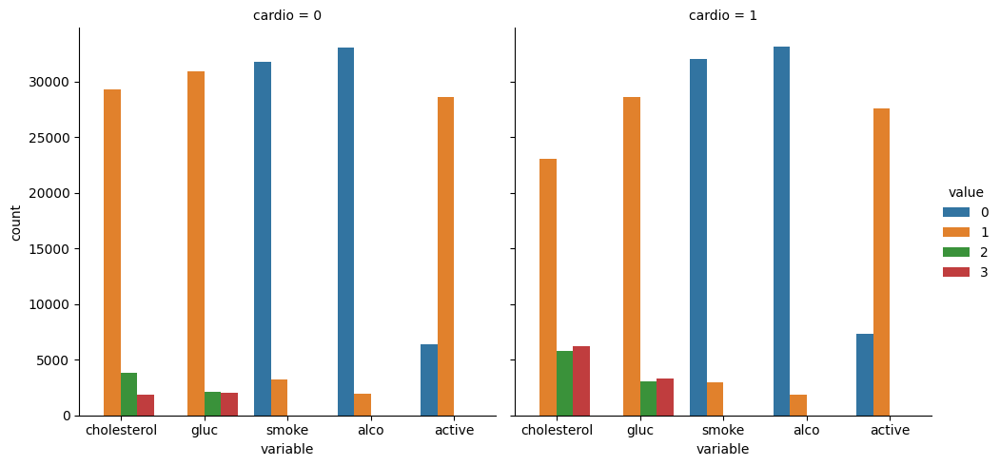

In [211]:
df_double = pd.melt(data, id_vars=['cardio'], value_vars=['cholesterol','gluc', 'smoke', 'alco', 'active'])
sns.catplot(x="variable", hue="value", col="cardio",data=df_double, kind="count");

<p>It can be clearly seen that  people suffuring from Cardiovascular Disease have higher cholesterol level and glucose level </p>

## Cleaning Data

In [212]:
#Checking fir any missing values or NA values in the dataset
data.isnull().values.any()

False

In [213]:
## Tampilkan 10 baris pertama dari dataset
data.head(10)

,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,2,168,62.0,110,80,1,1,0,0,1,0
1,1,156,85.0,140,90,3,1,0,0,1,1
2,1,165,64.0,130,70,3,1,0,0,0,1
3,2,169,82.0,150,100,1,1,0,0,1,1
4,1,156,56.0,100,60,1,1,0,0,0,0
5,1,151,67.0,120,80,2,2,0,0,0,0
6,1,157,93.0,130,80,3,1,0,0,1,0
7,2,178,95.0,130,90,3,3,0,0,1,1
8,1,158,71.0,110,70,1,1,0,0,1,0
9,1,164,68.0,110,60,1,1,0,0,0,0


## Data Training

In [233]:
## Ambil Baris 44 sampai 53
data_train = data[1:3500]
print(data_train)

      gender  height  weight  ap_hi  ap_lo  cholesterol  gluc  smoke  alco  \
1          1     156    85.0    140     90            3     1      0     0   
2          1     165    64.0    130     70            3     1      0     0   
3          2     169    82.0    150    100            1     1      0     0   
4          1     156    56.0    100     60            1     1      0     0   
5          1     151    67.0    120     80            2     2      0     0   
...      ...     ...     ...    ...    ...          ...   ...    ...   ...   
3495       1     159    67.0    110     70            1     1      0     0   
3496       2     171    82.0    120     80            1     1      0     0   
3497       1     170    89.0    140     80            1     1      0     0   
3498       2     169    55.0    100     60            1     1      1     0   
3499       1     155    70.0    110     70            2     1      0     0   

      active  cardio  
1          1       1  
2          0     

In [238]:
## Data ke 1 dan 6 akan diambil Inisialisasi Bobot
init_value = data_train.iloc[[0,5]]
print(init_value)

   gender  height  weight  ap_hi  ap_lo  cholesterol  gluc  smoke  alco  \
1       1     156    85.0    140     90            3     1      0     0   
6       1     157    93.0    130     80            3     1      0     0   

   active  cardio  
1       1       1  
6       1       0  


In [239]:
## Data Yang Akan Di Training
features_value = data_train.drop(data_train.index[[0, 2]]).values[:, :-1]
labels_value = data_train.iloc[:, -1].values # Labels

X = [[Decimal(str(item)) for item in vector] for vector in features_value]
y = [item for item in labels_value]

print("Features (X):")
print(X) #vector

print("\nLabels (y):")
print(y) #labels


Features (X):
[[Decimal('1.0'), Decimal('165.0'), Decimal('64.0'), Decimal('130.0'), Decimal('70.0'), Decimal('3.0'), Decimal('1.0'), Decimal('0.0'), Decimal('0.0'), Decimal('0.0')], [Decimal('1.0'), Decimal('156.0'), Decimal('56.0'), Decimal('100.0'), Decimal('60.0'), Decimal('1.0'), Decimal('1.0'), Decimal('0.0'), Decimal('0.0'), Decimal('0.0')], [Decimal('1.0'), Decimal('151.0'), Decimal('67.0'), Decimal('120.0'), Decimal('80.0'), Decimal('2.0'), Decimal('2.0'), Decimal('0.0'), Decimal('0.0'), Decimal('0.0')], [Decimal('1.0'), Decimal('157.0'), Decimal('93.0'), Decimal('130.0'), Decimal('80.0'), Decimal('3.0'), Decimal('1.0'), Decimal('0.0'), Decimal('0.0'), Decimal('1.0')], [Decimal('2.0'), Decimal('178.0'), Decimal('95.0'), Decimal('130.0'), Decimal('90.0'), Decimal('3.0'), Decimal('3.0'), Decimal('0.0'), Decimal('0.0'), Decimal('1.0')], [Decimal('1.0'), Decimal('158.0'), Decimal('71.0'), Decimal('110.0'), Decimal('70.0'), Decimal('1.0'), Decimal('1.0'), Decimal('0.0'), Decimal('0

In [240]:
class LVQ:
    def __init__(self, learning_rate, fungsi_pembelajaran, prototypes):
        self.learning_rate = Decimal(str(learning_rate))
        self.fungsi_pembelajaran = Decimal(str(fungsi_pembelajaran))
        self.prototypes = prototypes
    def calculate_euclidean(self, x, y):
        return math.sqrt(sum((xi - yi) ** 2 for xi, yi in zip(x, y)))

    def get_closest_prototype(self, data_vector):
        closest_distance = Decimal("inf")
        closest_prototype = None
        prototype_index = None
        for counter, prototype in enumerate(self.prototypes):
            distance = self.calculate_euclidean(data_vector, prototype[0])
            print(f"Jarak ke bobot {counter + 1}: {distance}")
            if distance < closest_distance:
                closest_distance = distance
                closest_prototype = prototype
                prototype_index = counter
        print(f"Jarak terkecil yaitu pada bobot ke-{prototype_index + 1}")
        print(f"Target data: {closest_prototype[1]}")
        return {
            "closest_prototype": closest_prototype,
            "distance": closest_distance,
            "prototype_index": prototype_index,
        }

    def train(self, vectors, labels, epochs):
        for epoch in range(epochs):
            print(f"\n=== Epoch ke-{epoch + 1} ===")
            lr = self.learning_rate * (self.fungsi_pembelajaran**epoch)
            print(f"\n(Learning rate: {lr:.{epoch+3}f})")
            for i, vector in enumerate(vectors):
                print("\n\n[ Data No.", i+1, "]") # Full dataset
                label = labels[i]
                closest_prototype = self.get_closest_prototype(vector)
                closest_prototype_vector = closest_prototype["closest_prototype"][0]
                new_prototype = [
                    xi + Decimal(lr) * (Decimal(vi) - Decimal(xi))
                    for xi, vi in zip(closest_prototype_vector, vector)
                ]
                self.prototypes[closest_prototype["prototype_index"]] = (
                    new_prototype,
                    label,
                )
                print("\nNilai bobot baru:")
                for i, prototype in enumerate(self.prototypes):
                    nilai_bobot = [float(bobot) for bobot in prototype[0]]
                    print(f"Bobot ke-{i+1}:", nilai_bobot)

    def predict(self, vectors):
        predictions = []
        for vector in vectors:
            closest_prototype = self.get_closest_prototype(vector)
            predictions.append(closest_prototype["closest_prototype"][1])
        return predictions


def main():
    prototypes = [
        ([2, 171, 69, 140, 90, 1, 1, 0, 0, 1], 1),  # Data baris ke-1
        ([1, 168, 69, 120, 80, 1, 1, 0, 0, 0], 0),  # Data baris ke-7
    ]

    # Initialize and train LVQ
    learning_rate = "0.005"
    fungsi_pembelajaran = "0.1"

    lvq_model = LVQ(learning_rate, fungsi_pembelajaran, prototypes)
    epochs = 5
    lvq_model.train(X, y, epochs)

    # Predict
    test_data = [
        [1, 155, 83, 160, 100, 2, 1, 0, 0, 1],  # Data baris ke-1
    ]
    # Display the predictions
    for i, row in enumerate(test_data):
        if (len(test_data)) == 1:
            print(row)
            break
        print(f">> Data uji ke-{i+1}", row)
    print("\n")
    predictions = lvq_model.predict(test_data)
    for i, prediction in enumerate(predictions):
        if len(predictions) == 1:
            print(
                "\nKesimpulan Hasil Prediksi: \nTarget data uji bernilai", (prediction)
            )
            break
        print(
            f"\nKesimpulan Hasil Prediksi: \nTarget data uji ke-{i+1} bernilai",
            (prediction),
        )
    print("\n============================")
        
if __name__ == "__main__":
    main()



=== Epoch ke-1 ===

(Learning rate: 0.005)


[ Data No. 1 ]
Jarak ke bobot 1: 23.811761799581316
Jarak ke bobot 2: 15.427248620541512
Jarak terkecil yaitu pada bobot ke-2
Target data: 0

Nilai bobot baru:
Bobot ke-1: [2.0, 171.0, 69.0, 140.0, 90.0, 1.0, 1.0, 0.0, 0.0, 1.0]
Bobot ke-2: [1.0, 167.985, 68.975, 120.05, 79.95, 1.01, 1.0, 0.0, 0.0, 0.0]


[ Data No. 2 ]
Jarak ke bobot 1: 53.81449618829484
Jarak ke bobot 2: 33.34660327529627
Jarak terkecil yaitu pada bobot ke-2
Target data: 1

Nilai bobot baru:
Bobot ke-1: [2.0, 171.0, 69.0, 140.0, 90.0, 1.0, 1.0, 0.0, 0.0, 1.0]
Bobot ke-2: [1.0, 167.925075, 68.910125, 119.94975, 79.85025, 1.00995, 1.0, 0.0, 0.0, 0.0]


[ Data No. 3 ]
Jarak ke bobot 1: 30.133038346638727
Jarak ke bobot 2: 17.09128112221989
Jarak terkecil yaitu pada bobot ke-2
Target data: 1

Nilai bobot baru:
Bobot ke-1: [2.0, 171.0, 69.0, 140.0, 90.0, 1.0, 1.0, 0.0, 0.0, 1.0]
Bobot ke-2: [1.0, 167.840449625, 68.900574375, 119.95000125, 79.85099875, 1.01490025, 1.005, 0.0, 0

## Testing LVQ